<a href="https://colab.research.google.com/github/ashutosh17dec/dl/blob/master/dataprep.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
import zipfile
import os
import h5py

In [0]:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

In [0]:
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [0]:
downloaded = drive.CreateFile({'id':'1_7MLIkrnH3y-u-5vW0KJKe9VeCXUFvG8'}) # replace the id with id of file you want to access
downloaded.GetContentFile('RHD_v1-1.zip') 

In [0]:
!rm -R '/content/train2017.zip.1'

rm: cannot remove '/content/train2017.zip.1': No such file or directory


In [0]:

!mkdir '/content/data'
!unzip '/content/RHD_v1-1.zip' -d '/content/data'

Archive:  /content/RHD_v1-1.zip
   creating: /content/data/RHD_published_v2/evaluation/
  inflating: /content/data/RHD_published_v2/evaluation/anno_evaluation.mat  
   creating: /content/data/RHD_published_v2/evaluation/mask/
 extracting: /content/data/RHD_published_v2/evaluation/mask/01320.png  
 extracting: /content/data/RHD_published_v2/evaluation/mask/02053.png  
  inflating: /content/data/RHD_published_v2/evaluation/mask/01146.png  
  inflating: /content/data/RHD_published_v2/evaluation/mask/02389.png  
  inflating: /content/data/RHD_published_v2/evaluation/mask/01952.png  
  inflating: /content/data/RHD_published_v2/evaluation/mask/01182.png  
 extracting: /content/data/RHD_published_v2/evaluation/mask/01119.png  
 extracting: /content/data/RHD_published_v2/evaluation/mask/00913.png  
  inflating: /content/data/RHD_published_v2/evaluation/mask/01542.png  
  inflating: /content/data/RHD_published_v2/evaluation/mask/01618.png  
 extracting: /content/data/RHD_published_v2/evaluation

In [0]:
#!wget http://images.cocodataset.org/zips/train2017.zip

In [0]:
path1 = "/content/data/RHD_published_v2/evaluation/"
path2 = "/content/data/RHD_published_v2/training/"
filename = ["color", "mask"]

(320, 320)
0


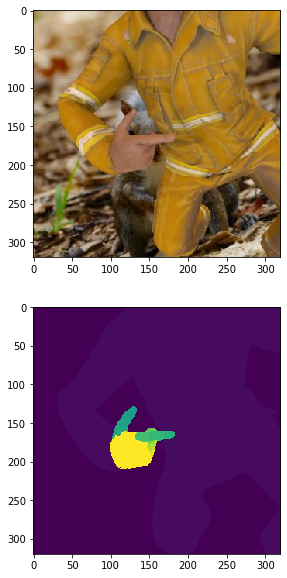

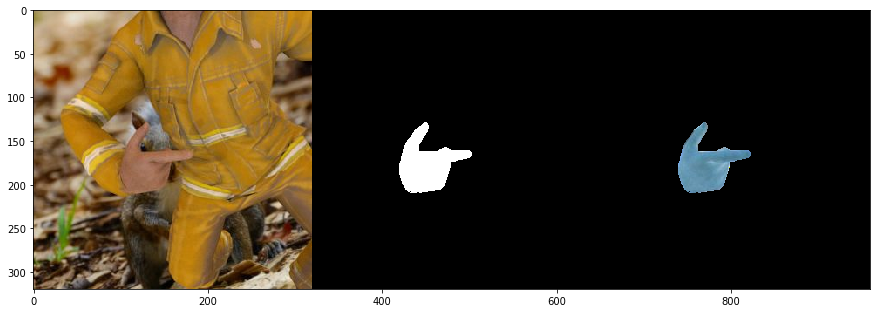

In [0]:
img = path1+filename[0]+"/02700.png"
img = cv2.imread(img)
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
plt.figure(1,figsize = (10,10))
plt.subplot(2,1,1)
plt.imshow(img)
img1 = path1+filename[1]+"/02700.png"
img1 = cv2.imread(img1)
img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2GRAY)
print(img1.shape)
plt.subplot(2,1,2)
plt.imshow(img1)
th3 = cv2.adaptiveThreshold(img1, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2);
r,th4 = cv2.threshold(img1,1,255,cv2.THRESH_BINARY)
print(th4[100,175])
msk = (np.stack((th4,)*3, axis=-1))
plt.figure(2,figsize = (15,15))
plt.imshow( np.concatenate([img, msk,img*msk ], axis = 1))

In [0]:
def getData( path, filename,k):
  pathX = path+filename[0]
  pathY = path+filename[1]
  Input = []
  GT = []
  for i in range(k,k+2500):
    name = str("%05d" % (i))+".png"
    if os.path.isfile(os.path.join(pathX,name)):
      img_input = cv2.imread(os.path.join(pathX,name))
      img_GT = cv2.imread(os.path.join(pathY, name))
      img_input = cv2.resize(img_input,(256,256))
      img_GT = cv2.resize(img_GT,(256,256))
      img_GT = cv2.cvtColor(img_GT, cv2.COLOR_BGR2GRAY)
      r, img_GT = cv2.threshold(img_GT,1,255,cv2.THRESH_BINARY)
      img_input = (img_input/255)
      img_input = img_input.astype(float)
      img_GT = (img_GT/255)
      img_GT = img_GT.astype(float)
      Input.append(img_input)
      GT.append(img_GT)
  GT = np.array(GT)
  Input = np.array(Input)
  return GT, Input

In [0]:
k = 0
Y_train, X_train = getData(path1,filename,k) 

In [0]:
hf = h5py.File('/content/drive/My Drive/hand_test_data.h5', 'w')
hf.create_dataset('X_test',data = X_train)
hf.create_dataset('Y_test',data = Y_train)
hf.close()

In [0]:
print(len([name for name in os.listdir('/content/data/RHD_published_v2/training/color') if os.path.isfile(os.path.join('/content/data/RHD_published_v2/training/color',name)) ]))

41258


In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


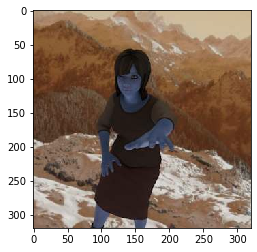

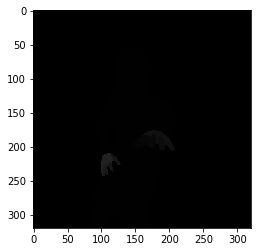